# "Luganda Translation Engine"

> Build a translation engine (English to another language) from scratch and train with opennmt
- toc: true
- branch: master
- badges: false
- comments: true
- hide: false
- search_exclude: true
- metadata_key1: metadata_value1
- metadata_key2: metadata_value2
- image: images/BuildTranslateEngine.png
- categories: [Translation_Industry,  Neural_Machine_Translation,NMT,  PyTorch,opennmt,Python,pandas,statsmodels,plotly,seaborn,matplotlib,java]
- show_tags: true

In [4992]:
#hide
# from google.colab import drive
# drive.mount('/content/gdrive', force_remount=True)
# root_dir = "/content/gdrive/My Drive/"
# base_dir = root_dir + 'TODANALYTICS/'
# base_dir = "/Users/kobus/Library/Mobile Documents/com~apple~CloudDocs/Documents/MESSAGE-MASTER-DATABASE/"

# Purpose
Machine translation is used increasingly to lighten the load of human translators. The critical component here is the *translation engine* which is a model that takes a sequence of source words and outputs another sequence of translated words. To train such a model many thousands of sentence pairs need to be aligned for training examples.

This project is about constructing a translation engine, from English to Luganda, for a client in Uganda.

# Dataset and Variables
A data-point in the dataset comes in the form of a sequence of "scalars" of type (nominal) categorical. The value assumed by each categorical is one of the words in the vocabulary for each language. Put in simple terms, each data-point is a English/Luganda sentence pair.

Currently, there are only 31,172 sentence pairs. This is not sufficient for a good enough translation engine. However, this can serve as a base to build upon and to derive an initial BLEU score for the engine.

In summary, the features of the dataset are:

* English sentence
* Luganda sentence

There is a relationship between the number of words (and the number of characters) in the source language and the target language. These relationships can be used to help identify miss-alignments in the training data. We make use of visualizations as well as the technique of identifying outliers beyond 3 sample standard deviations. So-called *studentized* outliers are used after fitting an Ordinary Least Squares (OLS) model.

# Data preparation process
Training data is forwarded as newly translated documents are completed. The current training data is extracted from about 24 translated documents. 

After a new translation is supplied, a human aligner aligns the Luganda text against an English file, separeted into sentences. This part of the process is error-prone. Consequently, the file with the alignments is dropped into a folder called WORK_PATH and then subjected to a Java-based suite of data preparation utilities:

* validator.jar
* selector.jar
* inspector.jar
* separator.jar 

# Setup the Environment

In [4993]:
from pathlib import Path
import pandas as pd
import glob
import re
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import statsmodels.api as sm
import numpy as np

In [4994]:
!python --version

Python 3.7.1


# Part 1(a): Prepare Data for a Single Document

In [4995]:
#hide
# ||||||||||||||||||||||||||||||||||||
# PREPARE TRAIN DATA USING THE MESSAGE
# ||||||||||||||||||||||||||||||||||||

In [4996]:
#
# set the language
LANG = 'LUG'; print(LANG)

LUG


In [4997]:
#hide
lang = LANG.lower()
WORK_PATH = Path(f"/Users/kobus/work_{lang}/tmp"); print(WORK_PATH)
UTIL_PATH = Path("/Users/kobus/work/utils"); print(UTIL_PATH)
MMDB_OTH_PATH = Path(f"/Users/kobus/Library/Mobile Documents/com~apple~CloudDocs/Documents/MESSAGE-MASTER-DATABASE/{LANG}/"); print(MMDB_OTH_PATH)
MMDB_ENG_PATH = Path(f"/Users/kobus/Library/Mobile Documents/com~apple~CloudDocs/Documents/MESSAGE-MASTER-DATABASE/ENG/"); print(MMDB_ENG_PATH)

/Users/kobus/work_lug/tmp
/Users/kobus/work/utils
/Users/kobus/Library/Mobile Documents/com~apple~CloudDocs/Documents/MESSAGE-MASTER-DATABASE/LUG
/Users/kobus/Library/Mobile Documents/com~apple~CloudDocs/Documents/MESSAGE-MASTER-DATABASE/ENG


## Validator

In [4998]:
#hide
# OPTION 1: HUMAN-ALIGNED
# MOVE ENG_ORIG file to WORK_PATH
# duplicate ENG_ORIG file in WORK_PATH
# append -P to suplicate of ENG file (and clean name)

# put '___from-abcdef___' file in WORK_PATH
# duplicate '___from-abcdef___' file, cleanup name and append -P
# rename '___from-rutfre-abcdef___' file with a leading '+'

# -P means sans Partial alignments
# if outliers will also (manually) be removed from the -P's change to -PO

In [4999]:
#hide
# OPTION 2: -T (TODTRAN FILE)
# put a copy of OTH -T file in WORK_PATH
# append -P to copy of OTH -T file
# put a copy of ENG file in WORK_PATH
# append -P to copy of ENG file
# -P means sans Partial alignments
# if outliers will also (manually) be removed from the -P's change to -PO

In [5000]:
#
# set the prefix for files
# PREFIX = '19'; print(PREFIX)
PREFIX = 'CA'; print(PREFIX)

CA


In [5001]:
#
# set the suffix for original English file
# ORIG_SUFFIX = 't'
ORIG_SUFFIX = 'B123'
# ORIG_SUFFIX = 'B123E1R'
print(ORIG_SUFFIX)

B123


In [5002]:
#
# set English and Other language filenames
ENG = !ls {WORK_PATH}/{PREFIX}*_*_ENG_*-P*.txt
ENG = ENG[0].split('/')[-1].split('.')[0]
OTH = !ls {WORK_PATH}/{PREFIX}*_*_{LANG}_*-P*.txt
OTH = OTH[0].split('/')[-1].split('.')[0]

In [5003]:
#
# set Original English filename
ENG_ORIG = !ls {WORK_PATH}/{PREFIX}*_*_ENG_*-{ORIG_SUFFIX}.txt
ENG_ORIG = ENG_ORIG[0].split('/')[-1].split('.')[0]

In [5004]:
#hide
print(ENG_ORIG)
print(ENG)
print(OTH)

CAB-09_TheLaodiceanChurchAge_ENG_18-1101-B123
CAB-09_TheLaodiceanChurchAge_ENG_18-1101-B123-P
CAB-09_TheLaodiceanChurchAge_LUG_18-1101-B123-P


In [5005]:
#
#find number of lines (including blank lines) to calc utilization
ENG_N_LINES = !wc -l {WORK_PATH}/"{ENG}".txt
ENG_N_LINES = int(ENG_N_LINES[0].split('/')[0])

In [5006]:
#
#find number of lines (including blank lines) to calc utilization
ENG_ORIG_N_LINES = !wc -l {WORK_PATH}/"{ENG_ORIG}".txt
ENG_ORIG_N_LINES = int(ENG_ORIG_N_LINES[0].split('/')[0])
print('SENTENCE UTILIZATION:', ENG_N_LINES/ENG_ORIG_N_LINES)

SENTENCE UTILIZATION: 0.9747736093143596


In [5007]:
#
# validator.jar tries to align English with Other language sentences
# !java -jar {UTIL_PATH}/validator.jar {WORK_PATH}/{ENG}.txt {WORK_PATH}/{OTH}.txt

In [5008]:
#hide
#KEEP RUNNING UNTIL THE BOTTOM OF THE OUTPUT REPORTS STATISTICS,  ELSE, WON'T GET ALL DATA !!!
# remove unwanted sentence pairs directly in the -P files
!java -jar {UTIL_PATH}/validator.jar {WORK_PATH}/"{ENG}".txt {WORK_PATH}/"{OTH}".txt




|||||||||||||||||||||||||||||||||||||||||||||||||||||
      VALIDATOR (version: 0.9)
|||||||||||||||||||||||||||||||||||||||||||||||||||||
DUMMY TO HOLD POSSIBLE Byte Order Mark (validator version: 0.9)
1.1.n Revelation 3:14-22
1.1.n Okubikkulirwa 3:14-22

1.2.s “And unto the angel of the church of the Laodiceans write:
1.2.s “Era eri malayika ow'ekkanisa ey'omu Lawodikiya wandiika nti:

1.3.s These things saith the Amen, the Faithful and True Witness, the Beginning of the Creation of God;
1.3.s Bw'Ati Bw'Ayogera Oyo Amiina omujulirwa era ow'amazima, Olubereberye lw'okutonda kwa Katonda.

1.6.s Because thou sayest, I am rich, and increased with goods, and have need of nothing; and knowest not that thou art wretched, and miserable, and poor, and blind, and naked:
1.6.s Kubanga ng'oyogera nti Ndi mugagga, era ngaggawadde, so ssiriiko kye nneetaaga, so tomanyi ng'oli munaku ggwe era asaasirwa era omwavu era omuzibe w'amaaso era ali obwereere:

1.7.s I counsel thee to buy of Me gold tri

20.11.n Ensonga kye tuva tumanya nti guno mulimu gwe ogw'enjawulo okugukola mu kiseera ekyo eri nti yatuukiriza dda ekitundu ekyo ekigamba “alikyusa emitima gya bakitaabwe eri abaana,” obuweereza obwo obwa Eriya bwe bwabeerawo wano mu Yokaana Omubatiza.

20.12.c Luke 1:17,
20.12.c Lukka 1:17,

20.13.s “And he shall go before Him in the Spirit and power of Elias, to turn the hearts of the fathers to the children, and the disobedient to the wisdom of the Just, to make ready a people prepared for the Lord.”
20.13.s “Alikulembera mu maaso Ge mu Mwoyo n'amagezi ga Eriya okukomyawo emitima gya bajjajja eri abaana n'abatawulira okutambuliranga mu magezi g'abatuukirivu; okutegekera Mukama abantu abaateekebwateekebwa.”

20.14.c In the ministry of John the “hearts of the fathers were turned to the children”.
20.14.c Mu buweereza bwa Yokaana “emitima gya bakitaabwe gyakyuka okudda eri abaana.” 

20.15.n We know that because Jesus said so.
20.15.n Ekyo tukimanyi kubanga Yesu bw'Atyo bwe Yayogera. 

29.42.n Bajja kuba nga tebasobola kuvaamu ekyo omubaka ky'asobola; Katonda Tagenda kubakakasa nga nnabbi ow'ennaku ezisembayo bw'ali, naye nga bakozesa ebigambo byabwe ebigulumivu n'ettutumu lyabwe eritali ddungi mu nsi yonna bajja kulabula abantu obutawuliriza musajja oyo (omubaka) era bajja kugamba nti ayigiriza bikyamu. 

29.43.n They are running exactly true to their fathers, the Pharisees, who were of the devil, for they claimed that both John and Jesus taught error.
29.43.n Batambulira ddala nga bakitaabwe, Abafalisaayo, abaali aba setaani, kubanga baagamba mbu Yokaana ne Yesu bombi baayigiriza bikyamu.




30.1.n Now why do these false prophets come against the true prophet and discredit his teaching?
30.1.n Kati lwaki bannabbi bano ab'obulimba balumba nnabbi ow'amazima era ne batyoboola okuyigiriza kwe? 

30.2.n Because they are running true to form as did their forefathers when in the days of Ahab they withstood Micaiah.
30.2.n Lwa kubanga badduka bakole ekibiina nga bajjajja 

84.1.n “You had better come before it is too late,” saith the Lord, “and buy of Me gold tried in the fire and then you will be truly rich.”
84.1.n “Muyingire ng'obudde tebunnayita,” bw'Ayogera Mukama, “mugule gye Ndi zaabu egezeseddwa mu muliro olwo munaabeera n'obugagga obutuufu.” 

84.2.n Are we getting it?
84.2.n Tukitegeera? 

84.3.n Listen to me, “Naked (physically) we came into the world, but naked (spiritually) we will NOT leave it.”
84.3.n Mumpulirize, “Twajja bwereere (mu mubiri) mu nsi naye TETULIVAAMU bwereere (mu by'omwoyo)” 

84.4.n Oh no, we are going to take something with us.
84.4.n Ohm, nedda, tugenda kubaako kye tugenda nakyo. 

84.5.n What that something is, is ALL we can take with us, nothing less and nothing more.
84.5.n Ekintu ekyo, bye BYONNA bye tuyinza okugenda nabyo, tekyeyongerako ate tekikendeerako. 

84.6.n So we had better be real careful now to see that we take something that will make us right before God.
84.6.n Kale twegenderereze ddala okulaba nti tuba

SENTENCES/PARAGRAPH (1383/123): 11.243902


In [5010]:
#
#missed marks that human aligner might have entered to indicate problems
# !cat {WORK_PATH}/19*_*_{LANG}_*.txt | grep XX
!cat {WORK_PATH}/{PREFIX}*_*_{LANG}_*.txt | grep XX

In [5011]:
#
#missed marks that human aligner might have entered to indicate problems
# !cat {WORK_PATH}/19*_*_{LANG}_*.txt | grep xx
!cat {WORK_PATH}/{PREFIX}*_*_{LANG}_*.txt | grep xx

In [5012]:
#
#missed marks that human aligner might have entered to indicate problems
# !cat {WORK_PATH}/19*_*_{LANG}_*.txt | grep !!
!cat {WORK_PATH}/{PREFIX}*_*_{LANG}_*.txt | grep !!

In [5013]:
#hide
#current induced mismatches
!cat {WORK_PATH}/{PREFIX}*_*_{LANG}_*.txt | grep zzzzzz
!cat {WORK_PATH}/{PREFIX}*_*_{LANG}_*.txt | grep zzzzzz | wc -l

       0


In [5014]:
#
#write -v file
!java -jar {UTIL_PATH}/validator.jar {WORK_PATH}/"{ENG}".txt {WORK_PATH}/"{OTH}".txt > {WORK_PATH}/0_"{ENG}"___"{OTH}"-v.txt

In [5015]:
#hide
#remove header
#- !sed '7d' {RAW_PATH}/0_{ENG}___{OTH}-v.txt > {RAW_PATH}/new-v.txt
!tail -n +7 {WORK_PATH}/0_"{ENG}"___"{OTH}"-v.txt > {WORK_PATH}/new-v.txt

In [5016]:
#hide
#remove footer
#- !head -n -2 {RAW_PATH}/new-v.txt > {RAW_PATH}/new2-v.txt
#- !head -n -2 {RAW_PATH}/new-v.txt
#- ! for j in \{1..5\}; do sed -i '$d' {RAW_PATH}/new-v.txt; done
#- for i in range(10):
#- ! sed '$d' {RAW_PATH}/new-v.txt > {RAW_PATH}/new-v.txt
#- ! sed -i '$d' {RAW_PATH}/new-v.txt
#- !tac {RAW_PATH}/new-v.txt
!sed '$d' {WORK_PATH}/new-v.txt|sed '$d'|sed '$d'|sed '$d'|sed '$d'|sed '$d'|sed '$d'|sed '$d'|sed '$d'|sed '$d' > {WORK_PATH}/0_"{ENG}"___"{OTH}"-v.txt
!rm {WORK_PATH}/new-v.txt

## Selector

In [5017]:
#hide
!ls {WORK_PATH}/0_*-v.txt

/Users/kobus/work_lug/tmp/0_CAB-09_TheLaodiceanChurchAge_ENG_18-1101-B123-P___CAB-09_TheLaodiceanChurchAge_LUG_18-1101-B123-P-v.txt


In [5018]:
def print_pairs(pairs_list):
    for i,p in enumerate(pairs_list):
        print(p)
        if i%2==1:
            if pairs_list[i-1].split(' ',1)[0] != pairs_list[i].split(' ',1)[0]:
                print('================ NOT A PAIR:', pairs_list[i-1].split(' ',1)[0], pairs_list[i].split(' ',1)[0])
                break
            else:
                print('\n')

In [5019]:
#hide
#inspect all brackets from -v file: Should occur in pairs
brackets = !cat {WORK_PATH}/0_*-v.txt | grep '\['
print_pairs(brackets)

In [5020]:
#hide
#inspect all parentheses from -v file: Should occur in pairs
parens = !cat {WORK_PATH}/0_*-v.txt | grep '('

#IF FIRST ROW DOES NOT HAVE DUMMY WITH PARENS:
del parens[0] #first row (dummy) with parens

print_pairs(parens)

2.9.n In fact this city was once called Diopolis (City of Zeus) in honor of their god.
2.9.n Ddala ekibuga kino kyali kyatuumibwako Diopolis (ekibuga kya Zewu) mu ngeri ey'okussaamu katonda waabwe ekitiibwa. 


8.4.n As a servant of God who has had multitudes of visions, of which NONE has ever failed, let me predict (I did not say prophesy, but predict) that this age will end around 1977.
8.4.n Ng'omuweereza wa Katonda afunye nnamungi w'okwolesebwa, nga ku kwolesebwa okwo kwonna TEWALI kwali kulemereddwa, leka nteebereze (sigambye kulagula, wabula kuteebereza) nti omulembe guno guliggwaako awo nga mu 1977. 


15.1.n Based on these seven visions, along with the rapid changes which have swept the world in the last fifty years, I PREDICT (I do not prophesy) that these visions will have all come to pass by 1977.
15.1.n Okusinziira ku kwolesebwa kuno okw'emirundi omusanvu, awamu n'enkyukakyuka ez'okumukumu eziyise mu nsi yonna mu myaka ataano egiyise, NTEEBEREZA (siragula) nti okwolesebwa k

In [5021]:
#hide
#inspect all mismatches from -v file: 
#   Fix 
#   OR
#   Transfer to FRAGMENTS files (OLD way)
!cat {WORK_PATH}/0_*-v.txt | pcregrep -M '\n\n!!!'

In [5022]:
#hide
#verify all mismatches are due to induction: # of lines should be equal
#rewrite -v file ABOVE

In [5023]:
#hide
#current induced mismatches
!cat {WORK_PATH}/0_*-v.txt | grep !!!
!cat {WORK_PATH}/0_*-v.txt | grep !!! | wc -l

       0


In [5024]:
#hide
#current induced mismatches
!cat {WORK_PATH}/{PREFIX}*_*_{LANG}_*.txt | grep zzzzzz
!cat {WORK_PATH}/{PREFIX}*_*_{LANG}_*.txt | grep zzzzzz | wc -l

       0


In [5025]:
#
#write -m file (contains all sentence matches)
!java -jar {UTIL_PATH}/selector.jar {WORK_PATH}/0_*-v.txt > {WORK_PATH}/0_"{ENG}"___"{OTH}"-m.txt

In [5026]:
#
#remove header
!tail -n +7 {WORK_PATH}/0_"{ENG}"___"{OTH}"-m.txt > {WORK_PATH}/new-m.txt
!mv {WORK_PATH}/new-m.txt {WORK_PATH}/0_"{ENG}"___"{OTH}"-m.txt

## Inspector

In [5027]:
#
#works better in a maxed command line window with small font
# !java -jar {UTIL_PATH}/inspector.jar {WORK_PATH}/0_*-m.txt 40

## Visualize this document's data

This visualization will help to identify outliers in terms of character length as well as word length.

In [5028]:
#
# function to convert a -m file to a dataframe
def dash_m_to_dataframe(all_files):
    dfs = []
    for i,filepath in enumerate(all_files): 
        #print(filepath)
        filename = filepath.split('/')[-1]; print(filename)
        f = open(filepath, 'r', encoding='utf-8')
        f.readline() #remove title line
        rows = []
        parts = filename.split('_')
        descriptor = parts[1]; #print('descriptor=', descriptor)
        lan_E = 'ENG'
        version_E = parts[4]
        lan_O = parts[9]
        version_O = parts[10].split('-m.')[0]
        eng_line = f.readline(); #print('eng_line =', eng_line)
        while eng_line != "":
            try:
                signature_E,content_E = eng_line.split(" ", 1)
            except:
                print('------- EXCEPTION: ', filepath)
                print('eng_line =', eng_line)            
            chars_E = len(content_E)
            words_E = len(re.findall(r'\w+', content_E))
            if not re.search("^[0-9]+\.[0-9]+\.[ncspqhijk]$", signature_E):
                print(f"------- INVALID ENG SIGNATURE: {signature_E}")

            oth_line = f.readline(); #print('oth_line =', oth_line)
            try:
                signature_O,content_O = oth_line.split(" ", 1)
            except:
                print('------- EXCEPTION: ', filepath)
                print('oth_line =', oth_line)
            chars_O = len(content_O)
            words_O = len(re.findall(r'\w+', content_O))
            if not re.search("^[0-9]+\.[0-9]+\.[ncspqhijk]$", signature_O):
                print(f"------- INVALID OTH SIGNATURE: {signature_O}")

            blank_line = f.readline()

            row = [descriptor, signature_E, lan_E, version_E, content_E, chars_E, words_E, lan_O, version_O, content_O, chars_O, words_O]; #print('row', row)
            rows.append(row)

            eng_line = f.readline(); #print('eng_line =', eng_line)
        #if i==200: break
        df = pd.DataFrame(rows)
        dfs.append(df)
    df_A = pd.concat(dfs, axis=0, ignore_index=True)
    df_A.columns = ['descriptor','sign','lan_E','version_E','content_E','chars_E','words_E','lan_O','version_O','content_O','chars_O','words_O']
    # pd.set_option('display.max_colwidth',20)
    print(df_A.shape)
    return df_A

In [5029]:
#hide
PATH = WORK_PATH; print(PATH)
all_files = glob.glob(f"{PATH}/*-m.txt"); print(len(all_files))

df_file = dash_m_to_dataframe(all_files)
df_file.shape

/Users/kobus/work_lug/tmp
1
0_CAB-09_TheLaodiceanChurchAge_ENG_18-1101-B123-P___CAB-09_TheLaodiceanChurchAge_LUG_18-1101-B123-P-m.txt
(1383, 12)


(1383, 12)

In [5030]:
#
#inspect the ranges of some key features
df_file.loc[:, ['chars_E','chars_O','words_E','words_O']].describe()

,chars_E,chars_O,words_E,words_O
count,1383.000000,1383.000000,1383.000000,1383.000000
mean,79.023138,83.774403,15.114244,12.201735
std,58.934272,62.557676,11.042870,9.438456
min,4.000000,8.000000,1.000000,1.000000
25%,35.000000,36.000000,7.000000,5.000000
50%,62.000000,68.000000,12.000000,10.000000
75%,107.000000,114.000000,20.500000,17.000000
max,408.000000,393.000000,75.000000,60.000000


In [5031]:
#hide
df_file[df_file['words_E']==0.0]# zero length ENG content: remove from both sides

,descriptor,sign,lan_E,version_E,content_E,chars_E,words_E,lan_O,version_O,content_O,chars_O,words_O


In [5032]:
#hide
df_file[df_file['words_O']==0.0] #zero length OTH content: remove from both sides

,descriptor,sign,lan_E,version_E,content_E,chars_E,words_E,lan_O,version_O,content_O,chars_O,words_O


In [5033]:
#hide
#tried to use plotly express' regression model on mac mini but got:
# ImportError: cannot import name 'factorial' from 'scipy.misc' (/Users/kobus/anaconda3/lib/python3.7/site-packages/scipy/misc/__init__.py)
# https://stackoverflow.com/questions/56283294/importerror-cannot-import-name-factorial
# python3.6 -m pip install scipy==1.2 --upgrade

# did NOT fix
# !python3.7 -m pip install scipy==1.2 --upgrade

## Fit linear models to remove outliers

In [5034]:
#hide
# #chars
# x = df_file.loc[:, ['chars_E']].values
# y = df_file.loc[:, ['chars_O']].values
# mod_c = linear_model.LinearRegression() #fit_intercept=True
# mod_c.fit(x, y)
# print('Coefficients: \n', mod_c.coef_)
# print('Intercept: \n', mod_c.intercept_)
# y_pred_c = mod_c.predict(x)

In [5035]:
#hide
#refs for outlier handling
# https://online.stat.psu.edu/stat462/node/87/
# https://stackoverflow.com/questions/46304514/access-standardized-residuals-cooks-values-hatvalues-leverage-etc-easily-i
# http://songhuiming.github.io/pages/2016/11/27/linear-regression-in-python-outliers-leverage-detect/
# https://robert-alvarez.github.io/2018-06-04-diagnostic_plots/
# https://www.datasklr.com/ols-least-squares-regression/diagnostics-for-leverage-and-influence
# https://stackoverflow.com/questions/41404817/statsmodels-add-constant-for-ols-intercept-what-is-this-actually-doing

In [5036]:
#
#chars
x = df_file.loc[:, ['chars_E']].values
y = df_file.loc[:, ['chars_O']].values
mod_c = sm.OLS(y, sm.add_constant(x)).fit() #add_constant() equiv of fit_intercept=True
influence = mod_c.get_influence()
leverage = influence.hat_matrix_diag #hat values
# cooks_d = influence.cooks_distance #Cook's D values (and p-values) as tuple of arrays
# sres_c = influence.resid_studentized_internal #standardized residuals
tres_c = influence.resid_studentized_external #studentized residuals
print('R-squared: \n', mod_c.rsquared)
# mod_c.summary()
mse_c = mod_c.mse_resid
# mod_c.mse_total
yh_c = mod_c.predict(sm.add_constant(x))

R-squared: 
 0.9413148090749979


In [5037]:
#
#words
x = df_file.loc[:, ['words_E']].values
y = df_file.loc[:, ['words_O']].values
mod_w = sm.OLS(y, sm.add_constant(x)).fit() #add_constant() equiv of fit_intercept=True
influence = mod_w.get_influence()
leverage = influence.hat_matrix_diag #hat values
# cooks_d = influence.cooks_distance #Cook's D values (and p-values) as tuple of arrays
# sres_w = influence.resid_studentized_internal #standardized residuals
tres_w = influence.resid_studentized_external #studentized residuals
print('R-squared: \n', mod_w.rsquared)
# mod_w.summary()
mse_w = mod_w.mse_resid
# mod_w.mse_total
yh_w = mod_w.predict(sm.add_constant(x))

R-squared: 
 0.9111426681625021


In [5038]:
#
#add yhat columns
df = df_file.copy()
df['yh_c'] = yh_c
df['yh_w'] = yh_w
# df.head()

In [5039]:
#
#add columns to indicate the presence of outliers
df['out_tres_c'] = False #char outlier
df['out_tres_w'] = False #word outlier
df['out_both'] = False #both outlier
df['outlier'] = 'not' #outlier type, n means not an outlier

# df['res'] = df['chars_O'] - df['prd_c']
# df['lev'] = leverage
# df['calc_sres'] = df['res']/(np.sqrt(mse*(1-df['lev'])))

df['tres_c'] = tres_c
df['tres_w'] = tres_w

df.loc[ np.abs(df['tres_c']) > 3, ['out_tres_c'] ] = True
df.loc[ np.abs(df['tres_c']) > 3, ['outlier'] ] = 'char' #char outlier

df.loc[ np.abs(df['tres_w']) > 3, ['out_tres_w'] ] = True
df.loc[ np.abs(df['tres_w']) > 3, ['outlier'] ] = 'word' #word outlier

df.loc[ (np.abs(df['tres_c']) > 3)&(np.abs(df['tres_w']) > 3), ['out_both'] ] = True
df.loc[ (np.abs(df['tres_c']) > 3)&(np.abs(df['tres_w']) > 3), ['outlier'] ] = 'both' #both outlier

print('total data-points:',len(df))
print('useful char data-points:',len(df[df['out_tres_c']==False]))
print('useful word data-points:',len(df[df['out_tres_w']==False]))
print('useful char & word data-points:',len(df[(df['out_tres_c']==False)&(df['out_tres_w']==False)]))
print('outlier char data-points:',len(df[df['out_tres_c']==True]))
print('outlier word data-points:',len(df[df['out_tres_w']==True]))
print('outlier char & word data-points:',len(df[df['out_both']==True]))
# df.head()

total data-points: 1383
useful char data-points: 1358
useful word data-points: 1363
useful char & word data-points: 1350
outlier char data-points: 25
outlier word data-points: 20
outlier char & word data-points: 12


In [5040]:
#hide
# df['tres_c'].describe()
# df['out_tres_c'].describe()

In [5041]:
#hide
fig = px.scatter(data_frame=df, x='chars_E', y='chars_O', 
                 #color='out_tres_c', 
                 color='outlier', 
                 color_discrete_map={'not':'green', 'char':'orange', 'word':'blue', 'both':'red'},
                 #symbol='out_both',
                 title='Translation Chars vs English Chars (outliers color-coded)', opacity=.8, 
                 hover_data=['descriptor','lan_O','sign','tres_c'], 
                 labels={'descriptor':'Descriptor','lan_O':'','sign':'Signature','tres_c':'Studentized residual'},
                )
fig.add_scatter(x=df['chars_E'], y=df['yh_c'])
# fig.add_scatter(x=df['chars_E'], y=(1+frac_c)*df['prd_c'])
# fig.add_scatter(x=df['chars_E'], y=(1-frac_c)*df['prd_c'])
fig.show()

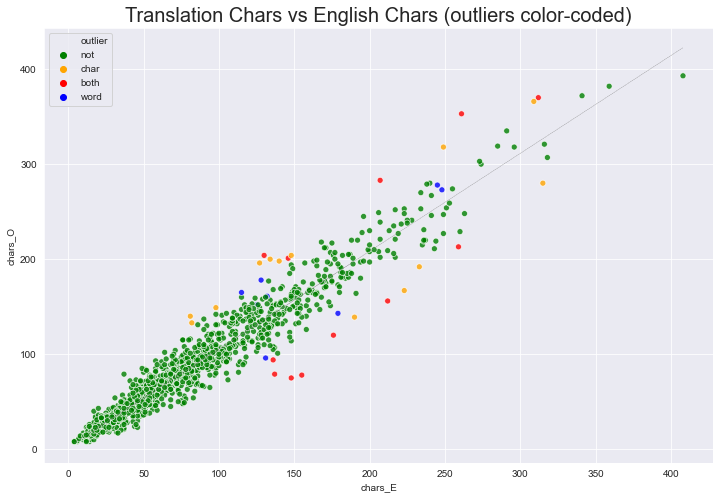

In [5042]:
sns.set_style('darkgrid')
plt.figure(figsize=(12,8))
# palette = {False: 'green', True: 'red'}
palette = {'not': 'green', 'char': 'orange', 'word': 'blue', 'both': 'red'}
ax = sns.scatterplot(x='chars_E', y='chars_O', 
                     #hue='out_tres_c',
                     hue='outlier', 
                     #style='out_both', 
                     data=df, alpha=.8, palette=palette)
ax.set_title("Translation Chars vs English Chars (outliers color-coded)", fontdict={'fontsize': 20})
plt.plot(df['chars_E'], df['yh_c'], color='grey', linestyle='-.', linewidth=.2);

In [5043]:
#hide
fig = px.scatter(data_frame=df, x='words_E', y='words_O', 
                 #color='out_tres_w', 
                 color='outlier', 
                 color_discrete_map={'not':'green', 'char':'orange', 'word':'blue', 'both':'red'},
                 #symbol='out_both',
                 title='Translation Words vs English Words (outliers color-coded)', opacity=.8, 
                 hover_data=['descriptor','lan_O','sign','tres_w'], 
                 #trendline="ols", trendline_color_override='black',
                 labels={'descriptor':'Descriptor','lan_O':'','sign':'Signature','tres_w':'Studentized residual'},
                 #trendline="ols", trendline_color_override="black"
                )
fig.add_scatter(x=df['words_E'], y=df['yh_w'])
fig.show()

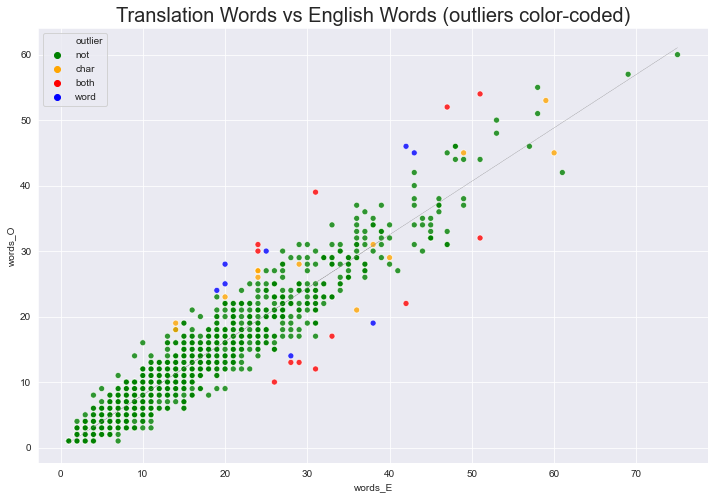

In [5044]:
sns.set_style('darkgrid')
plt.figure(figsize=(12,8))
# palette = {False: 'green', True: 'red'}
palette = {'not': 'green', 'char': 'orange', 'word': 'blue', 'both': 'red'}
ax = sns.scatterplot(x='words_E', y='words_O', 
                     #hue='out_tres_w', 
                     hue='outlier',
                     data=df, alpha=.8, palette=palette)
ax.set_title("Translation Words vs English Words (outliers color-coded)", fontdict={'fontsize': 20})
plt.plot(df['words_E'], df['yh_w'], color='grey', linestyle='-.', linewidth=.2);

In [5045]:
#hide
#show some char outliers
pd.set_option('display.max_colwidth',200)
# df.loc[df['out_tres_c']==True, ['sign','content_E','content_O','chars_O','yh_c','tres_c']]

In [5046]:
#hide
#show some word outliers
pd.set_option('display.max_colwidth',200)
# df.loc[df['out_tres_w']==True, ['sign','content_E','content_O','words_O','yh_w','tres_w']]

In [5047]:
#hide
# Save dataframe to csv file (includes outliers)
# df.to_csv(f'{WORK_PATH}/0_{ENG}___{OTH}.csv', sep='~', index = False, header=True)

## Separator (run in terminal) OR Generate separated files without outliers

Next, we remove all the outliers of type 'both'. These are the ones visualized in red above.

### Option 1: Run in terminal

In [5048]:
#hide
# java -jar ../../work/utils/separator.jar 0_1965-0711_Ashamed_ENG_18-0101-B123___1965-0711_Ashamed_LUG_18-0101-B123-m.txt

In [5049]:
#hide
# java -jar ../../work/utils/separator.jar 0_1965-0711_Ashamed_ENG_18-0101-B123___1965-0711_Ashamed_LUG_18-0101-B123-m.txt
# !ls {WORK_PATH}

In [5050]:
#hide
#rename
# !mv {WORK_PATH}/e_"{ENG}"___"{OTH}".en-af.af {WORK_PATH}/e_"{ENG}"___"{OTH}".{lang}.txt
# !mv {WORK_PATH}/f_"{ENG}"___"{OTH}".en-af.en {WORK_PATH}/f_"{ENG}"___"{OTH}".eng.txt

### Option 2: Generate separated files without outliers

In [5051]:
#
#previous summary again
print('total data-points:',len(df))
print('useful char data-points:',len(df[df['out_tres_c']==False]))
print('useful word data-points:',len(df[df['out_tres_w']==False]))
print('useful char & word data-points:',len(df[(df['out_tres_c']==False)&(df['out_tres_w']==False)]))
print('outlier char data-points:',len(df[df['out_tres_c']==True]))
print('outlier word data-points:' ,len(df[df['out_tres_w']==True]))
print('outlier char & word data-points:',len(df[df['out_both']==True]))

total data-points: 1383
useful char data-points: 1358
useful word data-points: 1363
useful char & word data-points: 1350
outlier char data-points: 25
outlier word data-points: 20
outlier char & word data-points: 12


In [5052]:
#hide
#show the outliers that are BOTH char and word
pd.set_option('display.max_colwidth',200)
df.loc[df['out_both']==True, ['sign','tres_c','chars_O','yh_c','tres_w','words_O','yh_w','content_E','content_O']]

,sign,tres_c,chars_O,yh_c,tres_w,words_O,yh_w,content_E,content_O
22,3.3.n,3.081444,370,323.709026,4.498347,54,41.479256,"This forecast the twentieth century 'one God, father-of-us-all' religious premise that sets forth the brotherhood of man, and is even now bringing together the Protestants, Catholics, Jews, Hindus...","Ekyo kyalanga ennyanjula y'ekinnaddiini ey'ekyasa kino ekya amakumi abiri ku “Katonda omu, kitaawe-wa-ffenna” eyo ereetawo oluganda olw'abantu, era ne kaakati nga luleeta awamu Abapulotesitante, A..."
26,4.2.n,3.195846,201,152.751503,3.768098,30,19.451211,"Was there ever an age like the twentieth century church age that has seen ALL nations rising up and demanding equality, socially and financially?\n","Waali wabaddewo omulembe okufaananako ng'omulembe gw'ekkanisa y'ekyasa ky'amakumi abiri ogwali gulabye amawanga GONNA nga gasituka nga gakaayanira omwenkanonkano, mu mbeera z'abantu ne mu by'ensim..."
142,20.7.s,-3.733508,213,269.126203,-3.395020,32,41.479256,"“Behold I will send you Elijah the prophet before the coming of the great and dreadful day of the Lord; and he shall turn the heart of the fathers to the children, and the heart of the children to...",“Laba Ndibatumira Eriya nnabbi olunaku olukulu olw'entiisa olwa Mukama nga terunnatuuka. Era alikyusa omutima gwa bakitaabwe eri abaana n'omutima gw'abaana eri bakitaabwe; nneme okujja ne nkuba en...
202,24.24.s,-5.608376,78,162.020284,-4.717618,12,25.162185,"And he shall turn the heart of the fathers to the children, and the heart of the children to their fathers, lest I come and smite the earth with a curse.“\n",Era alikyusa omutima gwa bakitaabwe; Nneme okujja ne Nkuba ensi n'ekikolimo.“\n
340,36.8.s,-3.209065,94,142.452857,-3.468326,13,22.714625,"And I will rejoice in Jerusalem and joy in My people: and the voice of weeping shall be no more heard in her, nor the voice of crying.“\n",so n'eddoboozi ery'okukaaba nga terikyawulirwa omwo nate newankubadde eddoboozi ery'okulira.“\n
347,36.15.n,-4.305795,156,220.722566,-4.350947,22,34.136575,"So we read it, “shall bless himself in the God of the AMEN, and he that sweareth in the earth shall swear by the God of the AMEN; because the former troubles are forgotten, and because they are hi...","Kale tukisoma bwe tuti, “Alyesabira omukisa mu Katonda Oyo Owa AMIINA; kubanga emitawaana egy'emabega gyerabiddwa, era kubanga gikwekeddwa mu maaso Gange. \n"
520,44.23.s,-5.320925,75,154.811232,-3.762776,13,23.530478,"“And He is the head of the body, the church: Who is the beginning, the first-born from the dead; that in all things He might have the preeminence.”\n","“Era Oyo gwe mutwe gw'omubiri, y'ekkanisa: Oyo lwe lubereberye mu byonna.”\n"
708,64.1.n,4.487648,283,215.573243,4.963995,39,25.162185,"There are paid preachers, paid assistants, paid ministers of music and education, paid choirs, paid custodians, programs, and entertainment—all costing great sums, but for all that, the power is d...","Waliwo ababuulizi ab'omusaala, ababeezi ab'omusaala, abaddukanya eby'ennyimba n'eby'enjigiriza nga ba musaala, kkwaya ez'omusaala, abavunaanyizibwa ab'omusaala, zipulogulaamu, n'eby'okusanyusa — n..."
955,81.19.s,-4.229624,120,183.647441,-3.498490,17,26.793893,"And the fruits that thy soul lusted after are departed from thee, and all things which were dainty and goodly are departed from thee, and thou shalt find them no more at all.“\n","N'ebibala omwoyo gwo bye gwegomba bikuvuddeko, n'ebintu byonna ebiwooma n'ebirungi bikuvuddeko, so tebakyabiraba nate.“\n"
1078,92.12.s,-4.283127,79,143.482721,-3.961479,10,21.082918,"For they verily for a few days chastened us after their own pleasure; but He for our profit, that we might be partakers of His holiness.\n","Kubanga baatukangavvula olw'okutugasa, tulyoke tufune omugabo ku butukuvu Bwe.\n"


### Option 1: Doing -PO files (ENG and OTH)

In [5053]:
#
# DON'T USE THIS OPTION: We may want to change the definition of an outlier in the future, 
# e.g. only values beyond 4 sample standard deviations. This option throws away outliers permanently.
# if doing -PO files:
#   manually delete the outliers in the previous cell (from both -P files and change names to -PO) 
#   and run again from the top, UNTIL no more combined outliers
# df_O = df.copy()

### Option 2: Doing -P files (ENG and OTH)

In [5055]:
#
# if doing -P files:
#   find outliers on BOTH counts (char model AND word model), drop them
# ixs = df[(df['out_tres_c']==True)&(df['out_tres_w']==True)].index; print(ixs)
out_ixs = df[df['out_both']==True].index; print(out_ixs)

Int64Index([22, 26, 142, 202, 340, 347, 520, 708, 955, 1078, 1157, 1271], dtype='int64')


In [5056]:
#
# if doing -P files: drop outliers
df_O = df.drop(out_ixs)

In [5057]:
print('total data-points:',len(df))
print('useful data-points:',len(df_O))
print('outlier char & word data-points:',len(df)-len(df_O))

total data-points: 1383
useful data-points: 1371
outlier char & word data-points: 12


In [5058]:
assert( len(df) == len(df_O) + len(out_ixs) )

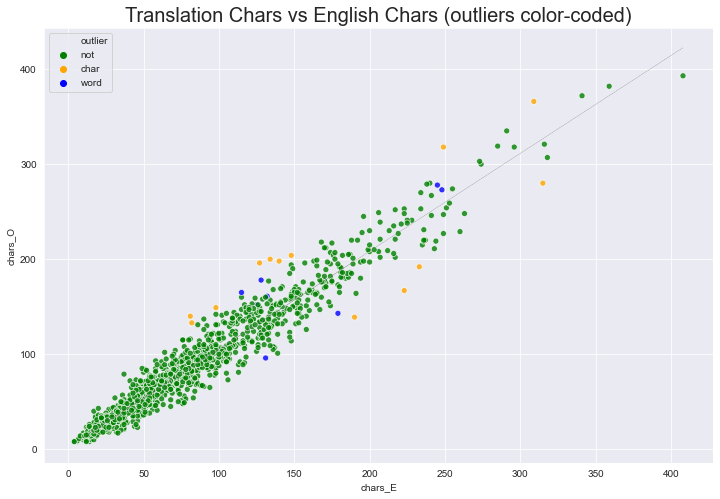

In [5059]:
sns.set_style('darkgrid')
plt.figure(figsize=(12,8))
# palette = {False: 'green', True: 'red'}
palette = {'not': 'green', 'char': 'orange', 'word': 'blue', 'both': 'red'}
ax = sns.scatterplot(x='chars_E', y='chars_O', 
                     #hue='out_tres_c',
                     hue='outlier', 
                     #style='out_both', 
                     data=df_O, alpha=.8, palette=palette)
ax.set_title("Translation Chars vs English Chars (outliers color-coded)", fontdict={'fontsize': 20})
plt.plot(df['chars_E'], df['yh_c'], color='grey', linestyle='-.', linewidth=.2);

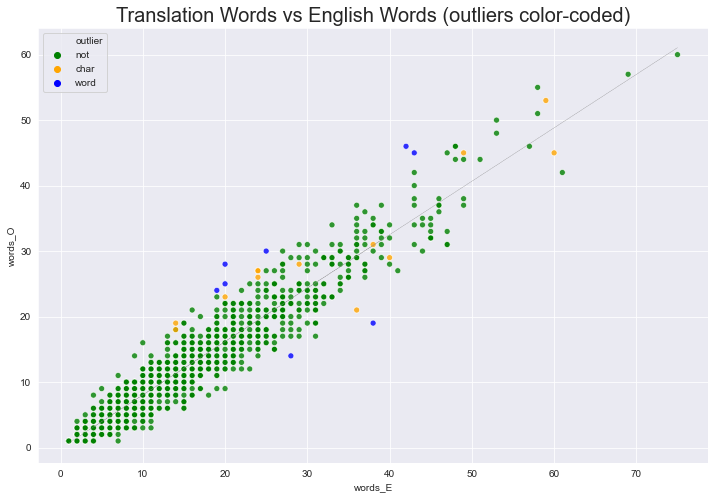

In [5060]:
sns.set_style('darkgrid')
plt.figure(figsize=(12,8))
# palette = {False: 'green', True: 'red'}
palette = {'not': 'green', 'char': 'orange', 'word': 'blue', 'both': 'red'}
ax = sns.scatterplot(x='words_E', y='words_O', 
                     #hue='out_tres_w', 
                     hue='outlier',
                     data=df_O, alpha=.8, palette=palette)
ax.set_title("Translation Words vs English Words (outliers color-coded)", fontdict={'fontsize': 20})
plt.plot(df['words_E'], df['yh_w'], color='grey', linestyle='-.', linewidth=.2);

## Write separated files

In [5061]:
#
#find number of lines (including blank lines) to calc updated utilization
ENG_N_LINES = !wc -l {WORK_PATH}/"{ENG}".txt
ENG_N_LINES = int(ENG_N_LINES[0].split('/')[0])
print('ENG_N_LINES - len(out_ixs):', ENG_N_LINES - len(out_ixs))

ENG_N_LINES - len(out_ixs): 1495


In [5062]:
#
#find number of lines (including blank lines) to calc updated utilization
ENG_ORIG_N_LINES = !wc -l {WORK_PATH}/"{ENG_ORIG}".txt
ENG_ORIG_N_LINES = int(ENG_ORIG_N_LINES[0].split('/')[0])
print('ENG_ORIG_N_LINES:', ENG_ORIG_N_LINES)
print('SENTENCE UTILIZATION (AFTER OUTLIER REMOVAL):', (ENG_N_LINES - len(out_ixs))/ENG_ORIG_N_LINES)

ENG_ORIG_N_LINES: 1546
SENTENCE UTILIZATION (AFTER OUTLIER REMOVAL): 0.9670116429495472


In [5063]:
#
# NOTE: ALWAYS USE -PO TO END THE FILE NAME!
#write separated files
with(open(f'{WORK_PATH}/f_{ENG}___{OTH}.eng-PO.txt', mode='w', encoding='UTF-8')) as f:
    for s in df_O['content_E']:
        f.write(s)
with(open(f'{WORK_PATH}/e_{ENG}___{OTH}.{lang}-PO.txt', mode='w', encoding='UTF-8')) as f:
    for s in df_O['content_O']:
        f.write(s)        

In [5064]:
#hide
#verify number of lines is the same in both files
# (no blank lines in these files)
!wc -l {WORK_PATH}/f_"{ENG}"___"{OTH}".eng-PO.txt
!wc -l {WORK_PATH}/e_"{ENG}"___"{OTH}".{lang}-PO.txt

    1371 /Users/kobus/work_lug/tmp/f_CAB-09_TheLaodiceanChurchAge_ENG_18-1101-B123-P___CAB-09_TheLaodiceanChurchAge_LUG_18-1101-B123-P.eng-PO.txt
    1371 /Users/kobus/work_lug/tmp/e_CAB-09_TheLaodiceanChurchAge_ENG_18-1101-B123-P___CAB-09_TheLaodiceanChurchAge_LUG_18-1101-B123-P.lug-PO.txt


## Cleanup and move to MMDB

In [5065]:
#hide
!ls {WORK_PATH}

0_CAB-09_TheLaodiceanChurchAge_ENG_18-1101-B123-P___CAB-09_TheLaodiceanChurchAge_LUG_18-1101-B123-P-m.txt
0_CAB-09_TheLaodiceanChurchAge_ENG_18-1101-B123-P___CAB-09_TheLaodiceanChurchAge_LUG_18-1101-B123-P-v.txt
CAB-09_TheLaodiceanChurchAge_ENG_18-1101-B123-P.txt
CAB-09_TheLaodiceanChurchAge_ENG_18-1101-B123.txt
CAB-09_TheLaodiceanChurchAge_LUG_18-1101-B123-P.txt
e_CAB-09_TheLaodiceanChurchAge_ENG_18-1101-B123-P___CAB-09_TheLaodiceanChurchAge_LUG_18-1101-B123-P.lug-PO.txt
f_CAB-09_TheLaodiceanChurchAge_ENG_18-1101-B123-P___CAB-09_TheLaodiceanChurchAge_LUG_18-1101-B123-P.eng-PO.txt


In [5066]:
#
#remove -v and -i files
!rm ./0_"{ENG}"___"{OTH}"-v.txt
!rm ./0_"{ENG}"___"{OTH}"-m.txt

!rm {WORK_PATH}/0_"{ENG}"___"{OTH}"-v.txt
# !rm {WORK_PATH}/0_"{ENG}"___"{OTH}"-i.txt

In [5067]:
#hide
# 1965-0711_Ashamed_ENG_18-0101-B123
# !mv {WORK_PATH}/"{ENG}".txt {WORK_PATH}/-"{ENG}".txt

In [5068]:
#
#move aligned source files to database folder
!mv {WORK_PATH}/"{ENG}".txt "{MMDB_OTH_PATH}"
!mv {WORK_PATH}/"{OTH}".txt "{MMDB_OTH_PATH}"

In [5069]:
#
#move -m file to database folder
!mv {WORK_PATH}/0_"{ENG}"___"{OTH}"-m.txt "{MMDB_OTH_PATH}"

In [5070]:
#
#move separated files to database folder
!mv {WORK_PATH}/e_"{ENG}"___"{OTH}".{lang}*.txt "{MMDB_OTH_PATH}"
!mv {WORK_PATH}/f_"{ENG}"___"{OTH}".eng*.txt "{MMDB_OTH_PATH}"

In [5071]:
#
#move original ENG file to database folder
!mv {WORK_PATH}/"{ENG_ORIG}".txt "{MMDB_ENG_PATH}"

In [5072]:
#hide
# !rm {WORK_PATH}/-"{ENG}".txt

In [5073]:
#hide
!ls {WORK_PATH}/*___from*.txt

ls: /Users/kobus/work_lug/tmp/*___from*.txt: No such file or directory


In [5074]:
#hide
#manually:
#remove '+' from '___from___' file and drag to OTH in MMDB
!mv {WORK_PATH}/*___from*.txt "{MMDB_OTH_PATH}"

mv: rename /Users/kobus/work_lug/tmp/*___from*.txt to /Users/kobus/Library/Mobile Documents/com~apple~CloudDocs/Documents/MESSAGE-MASTER-DATABASE/LUG/*___from*.txt: No such file or directory


In [5075]:
#hide
# \\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\
# END OF PREPARE TRAIN DATA USING THE MESSAGE
# \\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\

# Part 1(b): Prepare Data for All Documents
## Visualize data for all documents

In [4880]:
#hide
PATH = MMDB_OTH_PATH; print(MMDB_OTH_PATH)
all_files = glob.glob(f"{PATH}/*-m.txt"); print(len(all_files))
df_all_files = dash_m_to_dataframe(all_files)
df_all_files.shape

/Users/kobus/Library/Mobile Documents/com~apple~CloudDocs/Documents/MESSAGE-MASTER-DATABASE/LUG
23
0_CAB-02_ThePatmosVision_ENG_18-1102-B123-P___CAB-02_ThePatmosVision_LUG_18-1102-B123-P-m.txt
0_1965-0829_SatansEden_ENG_15-1104-B123-P___1965-0829_SatansEden_LUG_15-1104-B123-P-m.txt
0_CAB-08_ThePhiladelphianChurchAge_ENG_18-1101-B123-P___CAB-08_ThePhiladelphianChurchAge_LUG_18-1101-B123-P-m.txt
0_1965-0801x_TheGodOfThisEvilAge_ENG_18-0101-B123E1R-P___1965-0801x_TheGodOfThisEvilAge_LUG_18-0101-B123E1R-P-m.txt
0_CAB-07_TheSardiseanChurchAge_ENG_18-1101-B123-P___CAB-07_TheSardiseanChurchAge_LUG_18-1101-B123-P-m.txt
0_1965-0711_Ashamed_ENG_18-0101-B123-P___1965-0711_Ashamed_LUG_18-0101-B123-P-m.txt
0_1965-0429z_TheChoosingOfABride_ENG_15-1102-B123-P___1965-0429z_TheChoosingOfABride_LUG_15-1102-B123-P-m.txt
0_1965-0822z_AThinkingMansFilter_ENG_13-0201-B123E1R-P___1965-0822z_AThinkingMansFilter_LUG_13-0201-B123E1R-P-m.txt
0_1965-0718z_SpiritualFoodInDueSeason_ENG_18-0102-B123-P___1965-0718z_S

(31183, 12)

In [4881]:
#hide
# #
# # function to convert a f_/e_ files to a dataframe
# def fe_to_dataframe(all_files):
#     dfs = []
#     for i,filepath in enumerate(all_files): 
#         if i>3: break
#         #print(filepath)
#         filename = filepath.split('/')[-1]; print(filename)
#         with open(filepath, 'r', encoding='utf-8') as f:
#             lines = f.readlines()
#         print(lines[0])

In [4882]:
#hide
# PATH = MMDB_OTH_PATH; print(MMDB_OTH_PATH)
# f_sep_files = glob.glob(f"{PATH}/f_*-PO.txt"); print(len(f_sep_files))
# df_f_sep_files = fe_to_dataframe(f_sep_files)
# # df_f_sep_files.shape

In [4883]:
#1h 15 mins for 116 files
#chars
x = df_all_files.loc[:, ['chars_E']].values
y = df_all_files.loc[:, ['chars_O']].values
mod_c = sm.OLS(y, sm.add_constant(x)).fit() #add_constant() equiv of fit_intercept=True
influence = mod_c.get_influence()
leverage = influence.hat_matrix_diag #hat values
# cooks_d = influence.cooks_distance #Cook's D values (and p-values) as tuple of arrays
# sres_c = influence.resid_studentized_internal #standardized residuals
tres_c = influence.resid_studentized_external #studentized residuals
print('R-squared: \n', mod_c.rsquared)
# mod_c.summary()
mse_c = mod_c.mse_resid
# mod_c.mse_total
yh_c = mod_c.predict(sm.add_constant(x))

R-squared: 
 0.9457444061474136


In [4884]:
#1h 15 mins for 116 files
#words
x = df_all_files.loc[:, ['words_E']].values
y = df_all_files.loc[:, ['words_O']].values
mod_w = sm.OLS(y, sm.add_constant(x)).fit() #add_constant() equiv of fit_intercept=True
influence = mod_w.get_influence()
leverage = influence.hat_matrix_diag #hat values
# cooks_d = influence.cooks_distance #Cook's D values (and p-values) as tuple of arrays
# sres_w = influence.resid_studentized_internal #standardized residuals
tres_w = influence.resid_studentized_external #studentized residuals
print('R-squared: \n', mod_w.rsquared)
# mod_w.summary()
mse_w = mod_w.mse_resid
# mod_w.mse_total
yh_w = mod_w.predict(sm.add_constant(x))

R-squared: 
 0.9146194429311921


In [4891]:
#
#add yhat columns
df = df_all_files.copy()
df['yh_c'] = yh_c
df['yh_w'] = yh_w
pd.set_option('display.max_colwidth',20)
# df.head()

In [4892]:
#
#add columns to indicate the presence of outliers
df['out_tres_c'] = False #char outlier
df['out_tres_w'] = False #word outlier
df['out_both'] = False #both outlier
df['outlier'] = 'not' #outlier type, n means not an outlier

df['tres_c'] = tres_c
df['tres_w'] = tres_w

df.loc[ np.abs(df['tres_c']) > 3, ['out_tres_c'] ] = True
df.loc[ np.abs(df['tres_c']) > 3, ['outlier'] ] = 'char' #char outlier

df.loc[ np.abs(df['tres_w']) > 3, ['out_tres_w'] ] = True
df.loc[ np.abs(df['tres_w']) > 3, ['outlier'] ] = 'word' #word outlier

df.loc[ (np.abs(df['tres_c']) > 3)&(np.abs(df['tres_w']) > 3), ['out_both'] ] = True
df.loc[ (np.abs(df['tres_c']) > 3)&(np.abs(df['tres_w']) > 3), ['outlier'] ] = 'both' #both outlier

print('total data-points:',len(df))
print('useful char data-points:',len(df[df['out_tres_c']==False]))
print('useful word data-points:',len(df[df['out_tres_w']==False]))
print('useful char & word data-points:',len(df[(df['out_tres_c']==False)&(df['out_tres_w']==False)]))
print('outlier char data-points:',len(df[df['out_tres_c']==True]))
print('outlier word data-points:',len(df[df['out_tres_w']==True]))
print('outlier char & word data-points:',len(df[df['out_both']==True]))
# df.head()

total data-points: 31183
useful char data-points: 30659
useful word data-points: 30694
useful char & word data-points: 30429
outlier char data-points: 524
outlier word data-points: 489
outlier char & word data-points: 259


In [4893]:
#hide
fig = px.scatter(data_frame=df, x='chars_E', y='chars_O', 
                 #color='out_tres_c', 
                 color='outlier', 
                 color_discrete_map={'not':'green', 'char':'orange', 'word':'blue', 'both':'red'},
                 #symbol='out_both',
                 title='Translation Chars vs English Chars (outliers color-coded)', opacity=.8, 
                 hover_data=['descriptor','lan_O','sign','tres_c'], 
                 labels={'descriptor':'Descriptor','lan_O':'','sign':'Signature','tres_c':'Studentized residual'},
                )
fig.add_scatter(x=df['chars_E'], y=df['yh_c'])
# fig.add_scatter(x=df['chars_E'], y=(1+frac_c)*df['prd_c'])
# fig.add_scatter(x=df['chars_E'], y=(1-frac_c)*df['prd_c'])
fig.show()

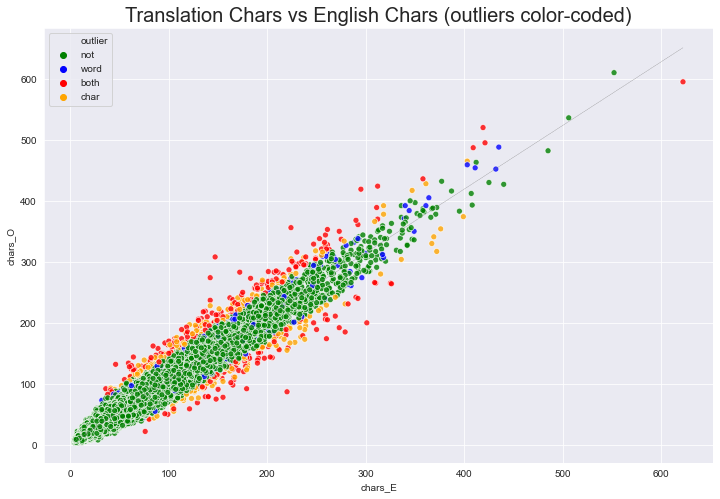

In [4894]:
sns.set_style('darkgrid')
plt.figure(figsize=(12,8))
# palette = {False: 'green', True: 'red'}
palette = {'not': 'green', 'char': 'orange', 'word': 'blue', 'both': 'red'}
ax = sns.scatterplot(x='chars_E', y='chars_O', 
                     #hue='out_tres_c',
                     hue='outlier', 
                     #style='out_both', 
                     data=df, alpha=.8, palette=palette)
ax.set_title("Translation Chars vs English Chars (outliers color-coded)", fontdict={'fontsize': 20})
plt.plot(df['chars_E'], df['yh_c'], color='grey', linestyle='-.', linewidth=.2);

In [4895]:
#hide
fig = px.scatter(data_frame=df, x='words_E', y='words_O', 
                 #color='out_tres_w', 
                 color='outlier', 
                 color_discrete_map={'not':'green', 'char':'orange', 'word':'blue', 'both':'red'},
                 #symbol='out_both',
                 title='Translation Words vs English Words (outliers color-coded)', opacity=.8, 
                 hover_data=['descriptor','lan_O','sign','tres_w'], 
                 #trendline="ols", trendline_color_override='black',
                 labels={'descriptor':'Descriptor','lan_O':'','sign':'Signature','tres_w':'Studentized residual'},
                 #trendline="ols", trendline_color_override="black"
                )
fig.add_scatter(x=df['words_E'], y=df['yh_w'])
fig.show()

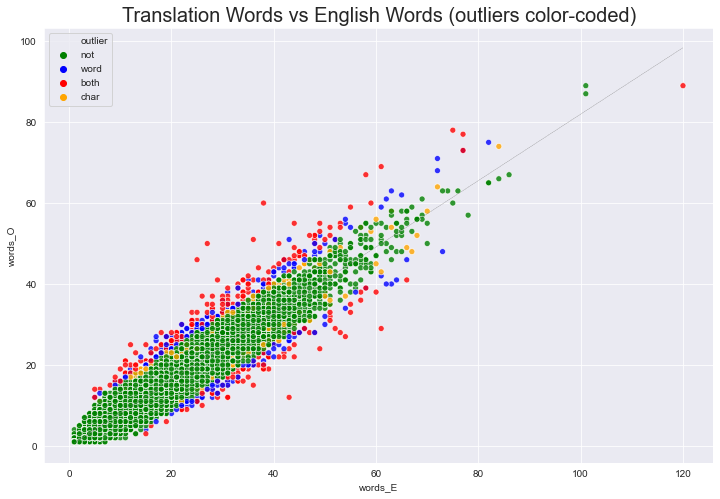

In [4896]:
sns.set_style('darkgrid')
plt.figure(figsize=(12,8))
# palette = {False: 'green', True: 'red'}
palette = {'not': 'green', 'char': 'orange', 'word': 'blue', 'both': 'red'}
ax = sns.scatterplot(x='words_E', y='words_O', 
                     #hue='out_tres_w', 
                     hue='outlier',
                     data=df, alpha=.8, palette=palette)
ax.set_title("Translation Words vs English Words (outliers color-coded)", fontdict={'fontsize': 20})
plt.plot(df['words_E'], df['yh_w'], color='grey', linestyle='-.', linewidth=.2);

In [4897]:
#
# find outliers on BOTH counts (char model AND word model), drop them
# ixs = df[(df['out_tres_c']==True)&(df['out_tres_w']==True)].index; print(ixs)
out_ixs = df[df['out_both']==True].index; print(out_ixs)

Int64Index([   31,   387,   390,   425,   431,   664,   989,  1155,  1180,
             1362,
            ...
            29306, 29518, 30253, 30456, 30487, 30489, 30532, 30604, 31059,
            31080],
           dtype='int64', length=259)


In [4898]:
#
# drop outliers
df_O = df.drop(out_ixs)

In [4899]:
print('total data-points:',len(df))
print('useful data-points:',len(df_O))
print('outlier char & word data-points:',len(df)-len(df_O))

total data-points: 31183
useful data-points: 30924
outlier char & word data-points: 259


In [4900]:
assert( len(df) == len(df_O) + len(out_ixs) )

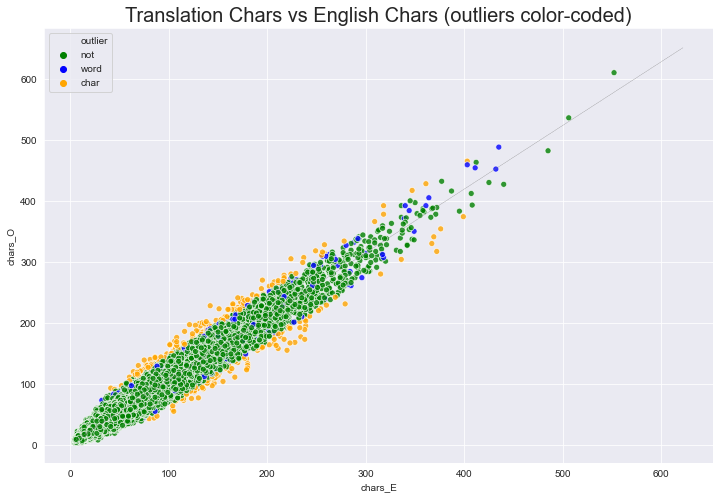

In [4901]:
sns.set_style('darkgrid')
plt.figure(figsize=(12,8))
# palette = {False: 'green', True: 'red'}
palette = {'not': 'green', 'char': 'orange', 'word': 'blue', 'both': 'red'}
ax = sns.scatterplot(x='chars_E', y='chars_O', 
                     #hue='out_tres_c',
                     hue='outlier', 
                     #style='out_both', 
                     data=df_O, alpha=.8, palette=palette)
ax.set_title("Translation Chars vs English Chars (outliers color-coded)", fontdict={'fontsize': 20})
plt.plot(df['chars_E'], df['yh_c'], color='grey', linestyle='-.', linewidth=.2);

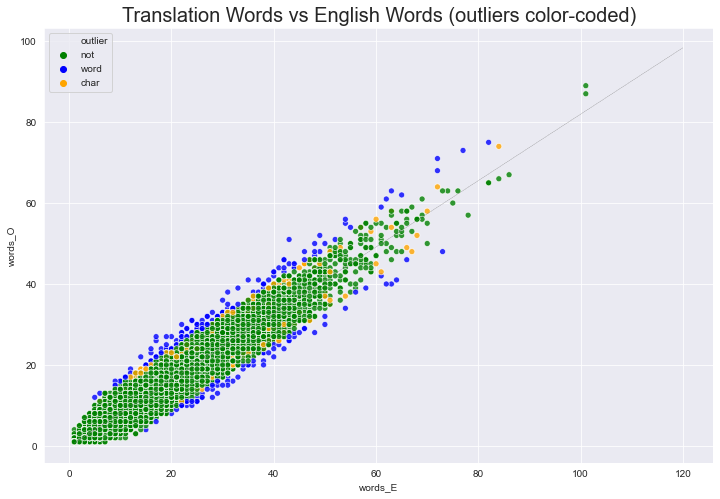

In [4902]:
sns.set_style('darkgrid')
plt.figure(figsize=(12,8))
# palette = {False: 'green', True: 'red'}
palette = {'not': 'green', 'char': 'orange', 'word': 'blue', 'both': 'red'}
ax = sns.scatterplot(x='words_E', y='words_O', 
                     #hue='out_tres_w', 
                     hue='outlier',
                     data=df_O, alpha=.8, palette=palette)
ax.set_title("Translation Words vs English Words (outliers color-coded)", fontdict={'fontsize': 20})
plt.plot(df['words_E'], df['yh_w'], color='grey', linestyle='-.', linewidth=.2);

## Save dash-m-dataframe

In [4903]:
df.columns

Index(['descriptor', 'sign', 'lan_E', 'version_E', 'content_E', 'chars_E',
       'words_E', 'lan_O', 'version_O', 'content_O', 'chars_O', 'words_O',
       'yh_c', 'yh_w', 'out_tres_c', 'out_tres_w', 'out_both', 'outlier',
       'tres_c', 'tres_w'],
      dtype='object')

In [4904]:
df.to_csv(f'{PATH}/dash-m-dataframe-{LANG}-O.csv', sep='~', index = False, header=True)

In [4905]:
#hide
# drag to TODANALYTICS/PredictMatchedWordAndCharCount on kobus78

# Part 2: Position Train Data on Azure

The purpose of this part is to position the train data for the translation engine, on an Azure virtual machine (VM). On this VM a copy of opennmt was installed previously. Opennmt is built on the popular PyTorch deep learning framework.

In [4906]:
#hide
# point to another folder:
WORK_PATH = Path("/Users/kobus/work_train"); print(WORK_PATH)

/Users/kobus/work_train


In [4907]:
#hide
# |||||||||||||||||||||||||||||||||||||||||||||||||||||
# POSITION TRAIN DATA USING TODNT (NT for Neural Technology, opennmt)
# |||||||||||||||||||||||||||||||||||||||||||||||||||||

In [4908]:
#hide
# inspect
# e_s = !ls "{MMDB_OTH_PATH}"/e_*
# [fn.split('/')[-1] for fn in e_s]

In [227]:
#hide
# inspect
# f_s = !ls "{MMDB_OTH_PATH}"/f_*
# [fn.split('/')[-1] for fn in f_s]

* if not correct name endings (example):
	* select all e_ files
		* rename .en-af.af to .bem.txt
	* select all f_ files
		* rename .en-af.en to .eng.txt

## For TrainSet: (only do when TrainSet has changed)

In [659]:
!cp "{MMDB_OTH_PATH}"/e_* {WORK_PATH}

In [660]:
!cp "{MMDB_OTH_PATH}"/f_* {WORK_PATH}

In [661]:
!ls -l {WORK_PATH}/e_* | wc -l

     116


In [662]:
!ls -l {WORK_PATH}/f_* | wc -l

     116


In [4909]:
# 
# - get names of train set, in a maxed mac terminal
#    cd ~/work_train
#    ls e_*

# - highlight all entries and copy

# - paste temporarily into textedit, then copy from here

# - open OpenNMTExperiment_OTH.xlsx, TrainSets tab

# - enter new TrainSet and paste in at the 'Titles' row

# - set the bottom of the sheet to 'Count'

# - select the paste and fill in the number of Messages

In [664]:
!cat `ls {WORK_PATH}/f_*` > {WORK_PATH}/train.eng.txt

In [665]:
!rm -f {WORK_PATH}/f_*

In [666]:
!cat `ls {WORK_PATH}/e_*` > {WORK_PATH}/train.{lang}.txt

In [667]:
!rm -f {WORK_PATH}/e_*

In [668]:
# 
# - open to validate, with vim
# 	= maximize a terminal on mac
# 	= vim .
# 	= select oth file
# 	= cmd+ until zoom level is OK
# 	= :vsp .
# 	= select eng file
# 	= :set number in both windows, use ctrl-w left/right to move between windows
# 	= :$ to go to end and see how many sentences, :1 to go to top again
# 	= take an evenly spread sample and verify alignment
# 		% use round numbers like 20000, 40000, 60000, etc //easier to recognize
# 		% locate with :20000, :40000, etc //puts target in center, easier to find
# 		% switch left-right with Ctrl-W, h/j
# 	= close vim

In [669]:
#hide
# !cat -n {WORK_PATH}/train.eng.txt | grep 'See?'
# eng_word_hits = !grep -ni "^[Ss]ee?\s*$" {WORK_PATH}/train.eng.txt
eng_word_hits = !grep -niE '^([Aa]men[\.!,]?)\s*$' {WORK_PATH}/train.eng.txt
len(eng_word_hits),eng_word_hits
# eng_word_lines = [hit.split(':')[0] for hit in eng_word_hits]
# len(eng_word_lines),eng_word_lines

(1146,
 ['28:Amen.',
  '97:Amen.',
  '728:Amen!',
  '762:Amen.',
  '854:Amen.',
  '892:Amen.',
  '1657:Amen!',
  '1737:Amen!',
  '2197:Amen!',
  '2290:Amen!',
  '2299:Amen.',
  '2339:Amen.',
  '2526:Amen.',
  '2543:Amen.',
  '3572:Amen.',
  '3574:Amen.',
  '3660:Amen.',
  '3960:Amen.',
  '3997:Amen.',
  '5223:Amen!',
  '5434:Amen.',
  '5641:Amen.',
  '5660:Amen.',
  '5673:Amen.',
  '5685:Amen.',
  '5688:Amen.',
  '5691:Amen.',
  '5707:Amen.',
  '5749:Amen.',
  '5763:Amen.',
  '5765:Amen.',
  '5810:Amen.',
  '5882:Amen.',
  '6095:Amen.',
  '6143:Amen.',
  '6169:Amen.',
  '6187:Amen.',
  '6220:Amen.',
  '6255:Amen.',
  '6565:Amen.',
  '6624:Amen.',
  '6644:Amen.',
  '6687:Amen.',
  '6708:Amen.',
  '6725:Amen.',
  '6753:Amen.',
  '6796:Amen.',
  '6803:Amen.',
  '6810:Amen.',
  '6833:Amen.',
  '6884:Amen.',
  '6926:Amen.',
  '7508:Amen.',
  '7520:Amen.',
  '7584:Amen.',
  '7723:Amen.',
  '7740:Amen!',
  '7742:Amen!',
  '7777:Amen.',
  '7881:Amen.',
  '7901:Amen.',
  '7916:Amen.',
  '8041:A

In [670]:
#hide
#BEM
# !cat {WORK_PATH}/train.{lang}.txt | grep 'Olaba?'
# oth_word_hits = !grep -niE '^([Oo]laba\?|[Mm]ulaba\?|[Mm]ukiraba\?)\s*$' {WORK_PATH}/train.{lang}.txt
oth_word_hits = !grep -niE '^([Aa]men[ie][\.!,]?)\s*$' {WORK_PATH}/train.{lang}.txt
len(oth_word_hits),oth_word_hits
# oth_word_lines = [hit.split(':')[0] for hit in oth_word_hits]
# len(oth_word_lines),oth_word_lines

(1146,
 ['28:Ameni.',
  '97:Ameni.',
  '728:Ameni!',
  '762:Ameni.',
  '854:Ameni.',
  '892:Ameni.',
  '1657:Ameni!',
  '1737:Ameni!',
  '2197:Ameni!',
  '2290:Ameni!',
  '2299:Ameni.',
  '2339:Ameni.',
  '2526:Ameni.',
  '2543:Ameni.',
  '3572:Ameni.',
  '3574:Ameni.',
  '3660:Ameni.',
  '3960:Ameni.',
  '3997:Ameni.',
  '5223:Ameni!',
  '5434:Ameni.',
  '5641:Ameni.',
  '5660:Ameni.',
  '5673:Ameni.',
  '5685:Ameni.',
  '5688:Ameni.',
  '5691:Ameni.',
  '5707:Ameni.',
  '5749:Ameni.',
  '5763:Ameni.',
  '5765:Ameni.',
  '5810:Ameni.',
  '5882:Ameni.',
  '6095:Ameni.',
  '6143:Ameni.',
  '6169:Ameni.',
  '6187:Ameni.',
  '6220:Ameni.',
  '6255:Ameni.',
  '6565:Ameni.',
  '6624:Ameni.',
  '6644:Ameni.',
  '6687:Ameni.',
  '6708:Ameni.',
  '6725:Ameni.',
  '6753:Ameni.',
  '6796:Ameni.',
  '6803:Ameni.',
  '6810:Ameni.',
  '6833:Ameni.',
  '6884:Ameni.',
  '6926:Ameni.',
  '7508:Ameni.',
  '7520:Ameni.',
  '7584:Ameni.',
  '7723:Ameni.',
  '7740:Ameni!',
  '7742:Ameni!',
  '7777:Ameni.'

In [143]:
#hide
#LUG
# !cat {WORK_PATH}/train.{lang}.txt | grep 'Olaba?'
# oth_word_hits = !grep -niE '^([Oo]laba\?|[Mm]ulaba\?|[Mm]ukiraba\?)\s*$' {WORK_PATH}/train.{lang}.txt
oth_word_hits = !grep -niE '^([Aa]miina[\.!,]?)\s*$' {WORK_PATH}/train.{lang}.txt
len(oth_word_hits),oth_word_hits
# oth_word_lines = [hit.split(':')[0] for hit in oth_word_hits]
# len(oth_word_lines),oth_word_lines

(0, [])

In [671]:
#hide
zip_hits = [((e.split(':')[0],e.split(':')[1]), (o.split(':')[0],o.split(':')[1])) for e,o in zip(eng_word_hits,oth_word_hits)]
zip_hits

[(('28', 'Amen.'), ('28', 'Ameni.')),
 (('97', 'Amen.'), ('97', 'Ameni.')),
 (('728', 'Amen!'), ('728', 'Ameni!')),
 (('762', 'Amen.'), ('762', 'Ameni.')),
 (('854', 'Amen.'), ('854', 'Ameni.')),
 (('892', 'Amen.'), ('892', 'Ameni.')),
 (('1657', 'Amen!'), ('1657', 'Ameni!')),
 (('1737', 'Amen!'), ('1737', 'Ameni!')),
 (('2197', 'Amen!'), ('2197', 'Ameni!')),
 (('2290', 'Amen!'), ('2290', 'Ameni!')),
 (('2299', 'Amen.'), ('2299', 'Ameni.')),
 (('2339', 'Amen.'), ('2339', 'Ameni.')),
 (('2526', 'Amen.'), ('2526', 'Ameni.')),
 (('2543', 'Amen.'), ('2543', 'Ameni.')),
 (('3572', 'Amen.'), ('3572', 'Ameni.')),
 (('3574', 'Amen.'), ('3574', 'Ameni.')),
 (('3660', 'Amen.'), ('3660', 'Ameni.')),
 (('3960', 'Amen.'), ('3960', 'Ameni.')),
 (('3997', 'Amen.'), ('3997', 'Ameni.')),
 (('5223', 'Amen!'), ('5223', 'Ameni!')),
 (('5434', 'Amen.'), ('5434', 'Ameni.')),
 (('5641', 'Amen.'), ('5641', 'Ameni.')),
 (('5660', 'Amen.'), ('5660', 'Ameni.')),
 (('5673', 'Amen.'), ('5673', 'Ameni.')),
 (('5685

In [673]:
#hide
#should be nothing
for e,o in zip_hits:
    if e[0]!=o[0]:
        print(e,o)
        break
#paste the ENG (left) line number into vim and cp both sides
#if you need to fix:
#     do part 1(a) again, 
#     1(b) can be skipped (just for modeling)

## End For TrainSet

## For TestSet: (only do when TestSet has changed)

In [ ]:
!cp "{MMDB_PATH}"/TestSet/e_* {WORK_PATH}

In [ ]:
!cp "{MMDB_PATH}"/TestSet/f_* {WORK_PATH}

In [ ]:
!ls -l {WORK_PATH}/e_* | wc -l

In [ ]:
!ls -l {WORK_PATH}/f_* | wc -l

In [ ]:
# 
# - get names of train set, in a maxed mac terminal
# cd ~/work_train
# ls e_*

# - highlight all entries and copy

# - paste temporarily into textedit, then copy from here

# - open OpenNMTExperiment_OTH.xlsx, TestSets tab

# - enter new id and paste in at the correct position

# - set the bottom of the sheet to 'Count'

# - select the paste and fill in the # messages

# - ensure the id of the TestSet is updated manually in the 
#    next statements (matching above id):

In [ ]:
!cat `ls {WORK_PATH}/f_*` > {WORK_PATH}/valid1.eng.txt

In [ ]:
!rm -f {WORK_PATH}/f_*

In [ ]:
!cat `ls {WORK_PATH}/e_*` > {WORK_PATH}/valid1.{lang}.txt

In [ ]:
!rm -f {WORK_PATH}/e_*

In [ ]:
# 
# - open to validate, with vim
# 	= maximize a terminal on mac
# 	= vim .
# 	= select oth file
# 	= cmd+ until zoom level is OK
# 	= :vsp .
# 	= select eng file
# 	= :set number in both windows, use ctrl-w left/right to move between windows
# 	= :$ to go to end and see how many sentences, :1 to go to top again
# 	= take an evenly spread sample and verify alignment
# 		% use round numbers like 20000, 40000, 60000, etc //easier to recognize
# 		% locate with :20000, :40000, etc //puts target in center, easier to find
# 		% switch left-right with Ctrl-W, h/j
# 	= close vim

## End For TestSet

In [ ]:
#hide
- set OTH env var below ( #============> )

- start azure + get IP
///ssh kobus78@13.77.136.235
40.125.76.5

- set IPADDR env below ( #---------------------> )

- on mac, set env (right terminal)
export IPADDR=40.125.76.5  #--------------------->
export OTH=bem  #============> bem,lua,lug
env

- on azure, set env (left terminal)
export IPADDR=40.125.76.5  #--------------------->
ssh kobus78@$IPADDR

. activate opennmt
export IPADDR=40.125.76.5  #--------------------->
export OTH=bem  #============> bem,lua,lug
env

cd todtran/OpenNMT-py/
ls -altrh $OTH

- cp to azure (right terminal)
	= on mac, work_train
scp train.eng.txt kobus78@$IPADDR:~/todtran/OpenNMT-py/$OTH
scp train.$OTH.txt kobus78@$IPADDR:~/todtran/OpenNMT-py/$OTH

- if new TestSet:
	= on azure  (left terminal)
scp valid1.eng.txt kobus78@$IPADDR:~/todtran/OpenNMT-py/$OTH
scp valid1.$OTH.txt kobus78@$IPADDR:~/todtran/OpenNMT-py/$OTH

- tokenize (left terminal)
	= on azure (validation set already tokenized and is on azure)
~/todtran/OpenNMT-py/tools/tokenizer.perl -l en < $OTH/train.eng.txt > $OTH/train.tok.eng.txt
~/todtran/OpenNMT-py/tools/tokenizer.perl -l en < $OTH/train.$OTH.txt > $OTH/train.tok.$OTH.txt

- if new TestSet:
	= on azure  (left terminal)
~/todtran/OpenNMT-py/tools/tokenizer.perl -l en < $OTH/valid1.eng.txt > $OTH/valid1.tok.eng.txt
~/todtran/OpenNMT-py/tools/tokenizer.perl -l en < $OTH/valid1.$OTH.txt > $OTH/valid1.tok.$OTH.txt

- NOTE: the ID of the train set will only be assigned during training, not now.

- shutdown azure - click 'Stop', wait until Status says 'Deallocated'

- on mac, work_train kobus$ 
wc -l train.eng.txt 

- if new TestSet:    
wc -l valid1.eng.txt

- insert # of last line in #Sentences for this TrainSet in MosesExperiment.xlsx (TrainSets tab)
165270
    
- if new TestSet:
- insert # of last line in #Sentences for this TestSet in MosesExperiment.xlsx (TestSets tab)
123

- on mac, work_train kobus$ 
rm train.eng.txt
rm train.oth.txt

In [ ]:
#hide
# \\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\
# END OF POSITION TRAIN DATA USING TODNT
# \\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\

# Part 3: Train engine using opennmt

The purpose of this part is to train a translation engine, making use of training and validation data. Training happens on a VM in Azure, pre-installed with the PyTorch-based opennmt library.

In [676]:
#hide
WORK_PATH = Path("/Users/kobus/work_train"); print(WORK_PATH)

/Users/kobus/work_train


In [677]:
#hide
# ||||||||||||||||||||||||||||||||||||
# TRAIN ENGINE USING TODNT
# ||||||||||||||||||||||||||||||||||||

In [ ]:
#hide
- ref for using env vars
https://unix.stackexchange.com/questions/10263/how-to-concatenate-string-variables-into-a-third

- set OTH env var below ( #============> )

- set ID env var below; this is id of train set ( #_____________> )

- start azure + get IP
///ssh kobus78@13.77.136.235
40.125.76.5

- set IPADDR env below ( #---------------------> )

- on mac, set env (right terminal)
export IPADDR=40.125.76.5  #--------------------->
export OTH=bem #============> bem,lua,lug
#export TITLE_ENG=CAB-01_TheRevelationOfJesusChrist_ENG_18-1101-
#export TITLE_OTH=CAB-01_TheRevelationOfJesusChrist_AFR_18-1101-
env

- on azure, set env (left terminal)
export IPADDR=40.125.76.5  #--------------------->
ssh kobus78@$IPADDR

. activate opennmt
export IPADDR=40.125.76.5  #--------------------->
export OTH=bem #============> bem,lua,lug
export ID=4 #_____________> afr:1-200, bem:2, lua=2, lug=1
env

cd todtran/OpenNMT-py/
ls -altrh $OTH

- if experiment
head -n 200000 $OTH/train1.tok.eng.txt > $OTH/train.tok.eng.txt
head -n 200000 $OTH/train1.tok.$OTH.txt > $OTH/train.tok.$OTH.txt

- ensure that tokenized:
ls -altrh $OTH

ENG is in train.tok.eng.txt
OTH is in train.tok.oth.txt

- on azure, preprocess (left terminal)
python preprocess.py -train_src $OTH/train.tok.eng.txt -train_tgt $OTH/train.tok.$OTH.txt -valid_src $OTH/valid1.tok.eng.txt -valid_tgt $OTH/valid1.tok.$OTH.txt -save_data $OTH/mydata

- on azure, train (left terminal)
export CUDA_VISIBLE_DEVICES=0
python train.py -data $OTH/mydata -save_model $OTH/mymodel -log_file $OTH/mylog.txt -world_size 1 -gpu_ranks 0

- on azure, get BLEU of model using valid1 (left terminal)
	= translate eng validation sentences
python translate.py -model $OTH/mymodel_step_100000.pt -src $OTH/valid1.tok.eng.txt -output $OTH/predict1.tok.$OTH.txt -replace_unk -verbose

	= find bleu
tools/multi-bleu.perl $OTH/valid1.tok.$OTH.txt < $OTH/predict1.tok.$OTH.txt
#BLEU = 43.54, 70.7/50.2/37.0/27.6 (BP=0.997, ratio=0.997, hyp_len=22938, ref_len=22997)

	= rename, on azure, ~/todtran/OpenNMT-py/oth 
cd $OTH
ls -al

mv mymodel_step_100000.pt model${ID}_step_100000.pt
rm mymodel_step_*

rm mydata.*
rm predict1.tok.$OTH.txt

mv train.tok.eng.txt train${ID}.tok.eng.txt
mv train.tok.$OTH.txt train${ID}.tok.$OTH.txt

mv mylog.txt log$ID.txt

- stop azure

In [ ]:
#hide
# \\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\
# END OF TRAIN ENGINE USING TODNT
# \\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\